Step 0: w0 = 0.0000, w1 = 1.0000, Loss = 1772.5000
Step 1: w0 = 0.0059, w1 = 1.2650, Loss = 1154.9398
Step 2: w0 = 0.0107, w1 = 1.4658, Loss = 800.1731
Step 3: w0 = 0.0146, w1 = 1.6181, Loss = 596.3688
Step 4: w0 = 0.0179, w1 = 1.7334, Loss = 479.2856
Step 5: w0 = 0.0207, w1 = 1.8209, Loss = 412.0196
Step 6: w0 = 0.0232, w1 = 1.8871, Loss = 373.3711
Step 7: w0 = 0.0254, w1 = 1.9373, Loss = 351.1622
Step 8: w0 = 0.0273, w1 = 1.9754, Loss = 338.3971
Step 9: w0 = 0.0291, w1 = 2.0042, Loss = 331.0569
Step 10: w0 = 0.0308, w1 = 2.0261, Loss = 326.8331
Step 11: w0 = 0.0324, w1 = 2.0426, Loss = 324.3995
Step 12: w0 = 0.0339, w1 = 2.0552, Loss = 322.9944
Step 13: w0 = 0.0354, w1 = 2.0647, Loss = 322.1800
Step 14: w0 = 0.0368, w1 = 2.0719, Loss = 321.7050
Step 15: w0 = 0.0382, w1 = 2.0773, Loss = 321.4249
Step 16: w0 = 0.0396, w1 = 2.0815, Loss = 321.2569
Step 17: w0 = 0.0409, w1 = 2.0846, Loss = 321.1531
Step 18: w0 = 0.0423, w1 = 2.0869, Loss = 321.0863
Step 19: w0 = 0.0436, w1 = 2.0887, Loss

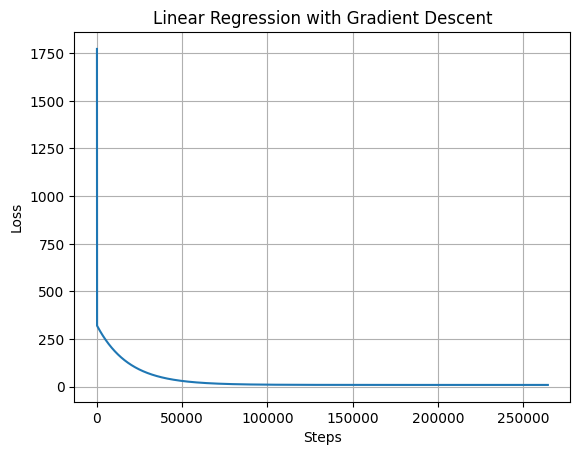

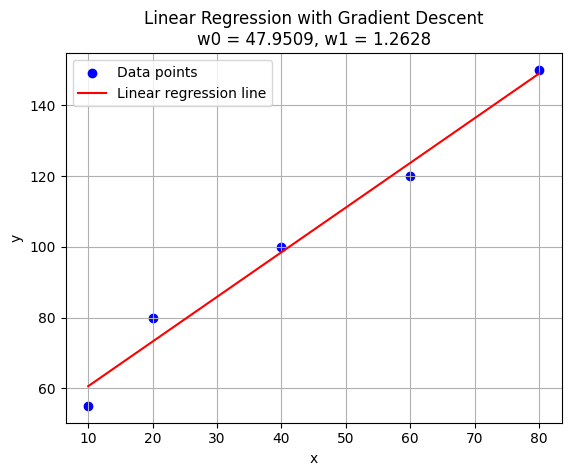

In [38]:
import csv
import matplotlib.pyplot as plt

file_path = r"C:\Users\DiepAnh\Desktop\M1-USTH\DeepLearning_\lr.csv"
x_data = []
y_data = []

with open(file_path, mode='r') as file:
    csvreader = csv.reader(file)
    for row in csvreader:
        x_data.append(float(row[0]))  
        y_data.append(float(row[1]))  

w0 = 0 
w1 = 1  
r = 0.0001  
epsilon = 1e-6  

def calculate_loss(w0, w1, x_data, y_data):
    N = len(x_data)
    total_loss = 0
    for i in range(N):
        y_pred = w1 * x_data[i] + w0
        loss = 0.5 * (y_pred - y_data[i]) ** 2  
        total_loss += loss
    return total_loss / N  

def calculate_gradients(w0, w1, x_data, y_data):
    grad_w0 = 0
    grad_w1 = 0
    N = len(x_data)
    for i in range(N):
        y_pred = w1 * x_data[i] + w0
        grad_w0 += (y_pred - y_data[i])
        grad_w1 += x_data[i] * (y_pred - y_data[i])
    grad_w0 /= N
    grad_w1 /= N
    return grad_w0, grad_w1

losses = []
w0_list = []
w1_list = []

steps = 0
while True:
    loss = calculate_loss(w0, w1, x_data, y_data)
    losses.append(loss)  
    w0_list.append(w0)
    w1_list.append(w1)

    print(f"Step {steps}: w0 = {w0:.4f}, w1 = {w1:.4f}, Loss = {loss:.4f}")

    grad_w0, grad_w1 = calculate_gradients(w0, w1, x_data, y_data)
    w0_new = w0 - r * grad_w0
    w1_new = w1 - r * grad_w1

    if abs(w0_new - w0) < epsilon and abs(w1_new - w1) < epsilon:
        break

    w0 = w0_new
    w1 = w1_new
    steps += 1

print(f"Final result: w0 = {w0:.4f}, w1 = {w1:.4f}, after {steps} steps")

plt.plot(losses)
plt.xlabel('Steps')
plt.ylabel('Loss')
plt.title('Linear Regression with Gradient Descent')
plt.grid(True)
plt.show()

x_range = [int(x) for x in range(int(min(x_data)), int(max(x_data)) + 1)]
y_range = [w1 * x + w0 for x in x_range]

plt.scatter(x_data, y_data, color='blue', label='Data points')  
plt.plot(x_range, y_range, color='red', label='Linear regression line')  

plt.xlabel('x')
plt.ylabel('y')
plt.legend()
plt.title(f'Linear Regression with Gradient Descent\nw0 = {w0:.4f}, w1 = {w1:.4f}')

plt.grid(True)
plt.show()
